<a href="https://colab.research.google.com/github/MiguelAngeloTr/Deep_Learning/blob/main/C2/Semana_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Teoria

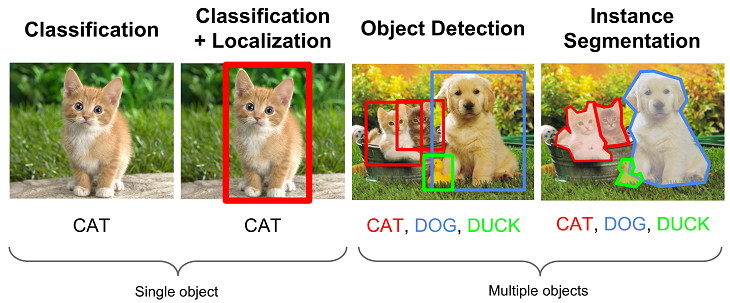

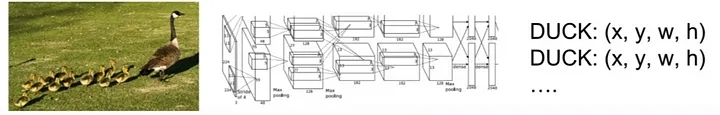

La razón principal por la que no se puede continuar con este problema construyendo una red convolucional estándar seguida de una capa completamente conectada es que la longitud de la capa de salida es variable, no constante, esto se debe a que el número de apariciones de los objetos de interés es dinámico. Un enfoque ingenuo para resolver este problema sería tomar diferentes regiones de interés de la imagen y utilizar una CNN para clasificar la presencia del objeto dentro de esa región. El problema con este enfoque es que los objetos de interés pueden tener diferentes ubicaciones espaciales dentro de la imagen y diferentes relaciones de aspecto. Por lo tanto, habría que seleccionar una gran cantidad de regiones y esto podría explotar computacionalmente. Por lo tanto, se han desarrollado algoritmos como R-CNN, YOLO, etc. para encontrar estos sucesos y encontrarlos rápidamente.


## **RCNN**

[Paper](https://arxiv.org/abs/1311.2524)

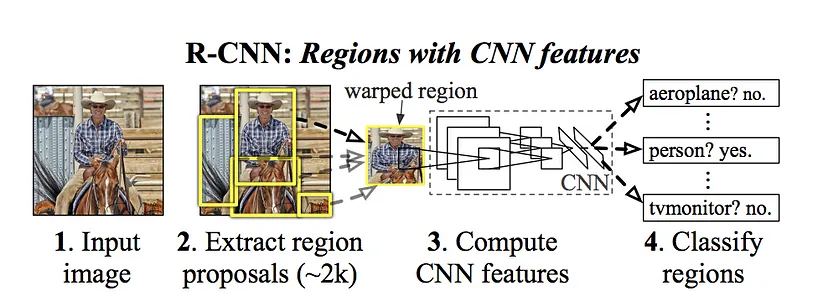

Para evitar el problema de seleccionar una gran cantidad de regiones, Ross Girshick et al . propuso un método en el que utilizamos la búsqueda selectiva para extraer solo 2000 regiones de la imagen y las llamó propuestas de región. Por lo tanto, ahora, en lugar de intentar clasificar una gran cantidad de regiones, puede trabajar simplemente con 2000 regiones.

Búsqueda selectiva:
1. Generamos subsegmentación inicial, generamos muchas regiones candidatas
2. Usamos un algoritmo codicioso para combinar recursivamente regiones similares en otras más grandes
3. Usamos las regiones generadas para producir las propuestas finales de regiones candidatas

In [ ]:
from IPython.display import Image
print("Convolución con padding")
Image(url='https://pyimagesearch.com/wp-content/uploads/2014/10/sliding_window_example.gif')

Convolución con padding


In [ ]:
! pip install selective-search
import skimage
import selective_search
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

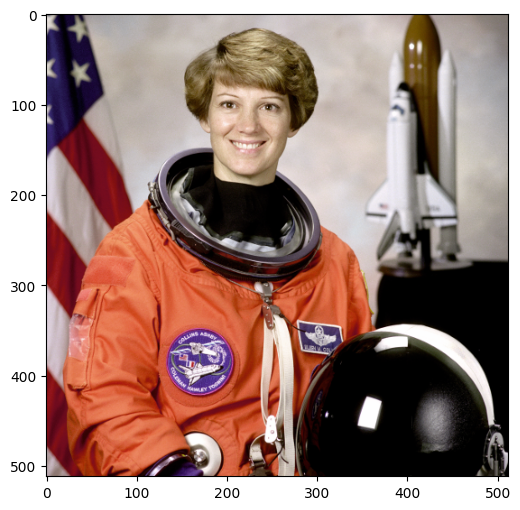

In [ ]:
# Load image
image = skimage.data.astronaut()
fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(image)

In [ ]:
# Propose boxes using selective search
boxes = selective_search.selective_search(image, mode='fast')

La búsqueda selectiva es un algoritmo utilizado para generar propuestas de regiones que posiblemente contengan objetos dentro de una imagen. Este método combina técnicas de segmentación de imágenes y agrupamiento jerárquico para identificar áreas de interés de manera eficiente.

Pasos clave del algoritmo:

Sobresegmentación de la imagen: Se divide la imagen en múltiples regiones pequeñas y homogéneas utilizando algoritmos de segmentación como el de Felzenszwalb y Huttenlocher. Esto crea una base de segmentos iniciales basados en similitudes locales.

Cálculo de similitud entre regiones adyacentes: Para cada par de regiones adyacentes, se calcula una medida de similitud basada en características como color, textura, forma y tamaño.

Agrupamiento jerárquico: Las regiones más similares se fusionan iterativamente. Después de cada fusión, se actualizan las medidas de similitud para reflejar los cambios en las regiones.

Generación de propuestas de regiones: A lo largo del proceso de agrupamiento, se registran todas las regiones formadas en cada nivel jerárquico como posibles propuestas de objetos.

Procesamiento en múltiples escalas: Para capturar objetos de diferentes tamaños, el algoritmo se aplica en varias escalas, ajustando los parámetros de segmentación.

Consolidación de propuestas: Se combinan todas las regiones propuestas de las diferentes escalas para formar un conjunto final de regiones candidatas.

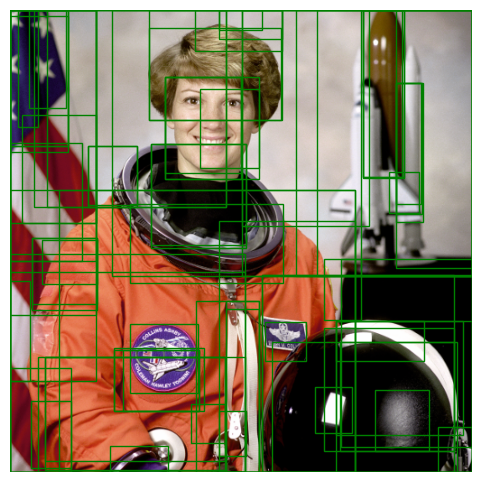

In [ ]:
boxes_filter = selective_search.box_filter(boxes, min_size=20, topN=80)
# drawing rectangles on the original image
fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(image)
for x1, y1, x2, y2 in boxes_filter:
    bbox = mpatches.Rectangle(
        (x1, y1), (x2-x1), (y2-y1), fill=False, edgecolor='green', linewidth=1)
    ax.add_patch(bbox)
plt.axis('off')
plt.show()


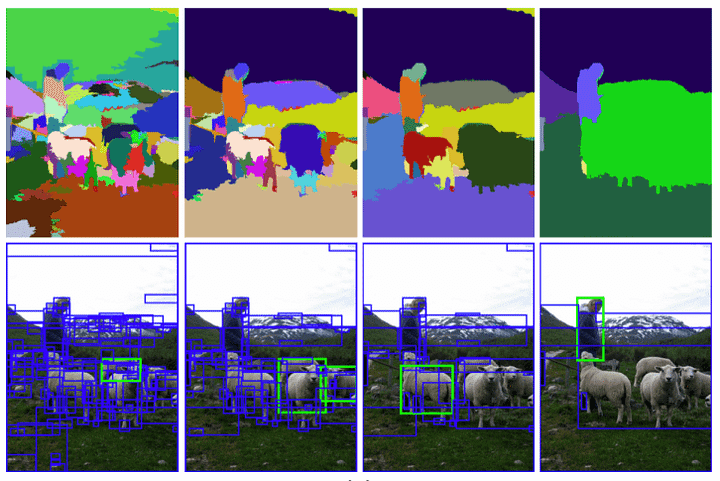

Dado que las áreas del rectángulo seleccionadas tienen varios tamaños, todas las áreas se deforman (cambian de tamaño) a un tamaño fijo de 227×227 píxeles. Garantiza que las dimensiones del cuadro delimitador sean constantes y que todas las características extraídas por las capas CNN den como resultado las dimensiones exactas.

**Extracción de características de CNN**
R-CNN utiliza capas CNN de AlexNet para extraer características de regiones seleccionadas y deformadas en imágenes. En ese momento, AlexNet era una buena opción, ya que encabezó el ILSVRC (ImageNet Large Scale Visual Recognition Challenge) en 2012, que se convirtió en un modelo famoso que desencadenó el reavivamiento de la fiebre de la investigación del aprendizaje profundo.

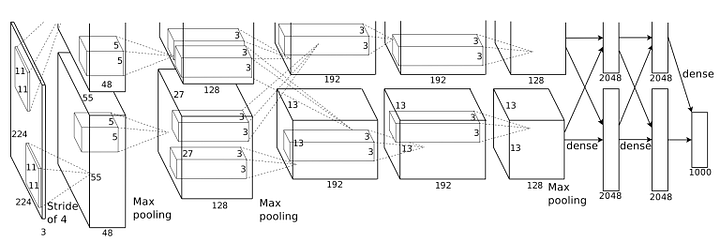

R-CNN utiliza cinco capas convolucionales y dos capas completamente conectadas en AlexNet para extraer características de cada área (227 × 227 píxeles) en un vector de 4096 dimensiones. Luego utiliza las funciones para clasificar las imágenes en cada área. Es aprendizaje por transferencia, donde la parte final es SVM ( máquina de vectores de soporte ) que toma la decisión sobre la clasificación de imágenes. SVM era un método ampliamente utilizado y siguieron el mismo enfoque para el último paso de clasificación.

**Clasificación SVM**
La siguiente imagen describe todo el proceso, incluida la parte que emplea SVM, que toma características extraídas para calcular una puntuación para cada clase.

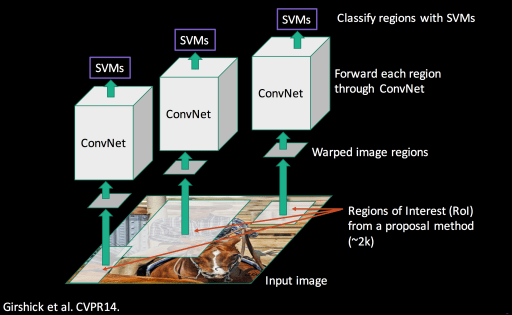

Dado que una SVM solo puede juzgar la autenticidad de una clase, tiene un modelo SVM por clase. Suena muy lento, pero no es tan malo.
Con los pasos hasta este punto, R-CNN completa la clasificación de imágenes para cada área seleccionada. A continuación, la detección de objetos requiere un posprocesamiento.

**NMS (supresión no máxima)**

Es un método de visión por computadora bien conocido y no es exclusivo de R-CNN. En pocas palabras, es una forma de eliminar predicciones superpuestas para dejar el cuadro delimitador más probable. Por ejemplo, la siguiente figura muestra cuadros delimitadores superpuestos para un objeto (“perro” en este caso).

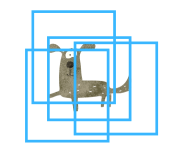

NMS elimina los cuadros delimitadores superpuestos utilizando la puntuación (confianza) calculada por los modelos SVM. Elimina las predicciones con puntuaciones más bajas y deja la predicción más segura.

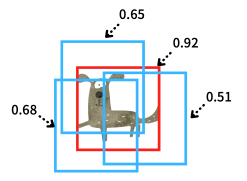

Efectivamente, dejará una predicción por objeto (dependiendo de la precisión de la predicción del cuadro delimitador y la puntuación de confianza).

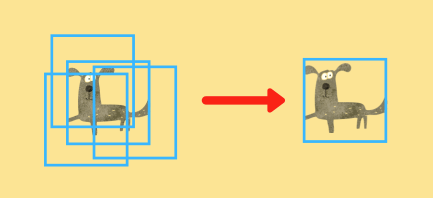

## Fast RCNN

Problemas con R-CNN

* Todavía lleva una gran cantidad de tiempo entrenar la red, ya que habría que clasificar 2000 propuestas regionales por imagen.

* No se puede implementar en tiempo real, ya que cada imagen de prueba tarda alrededor de 47 segundos.

* El algoritmo de búsqueda selectiva es un algoritmo fijo. Por lo tanto, en esa etapa no se produce ningún aprendizaje. Esto podría conducir a la generación de malas propuestas de regiones candidatas.

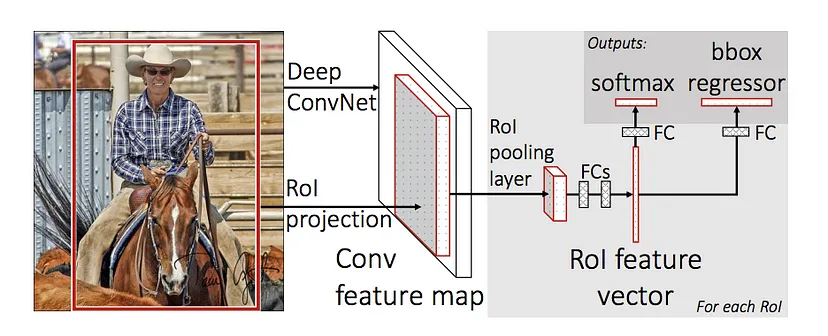

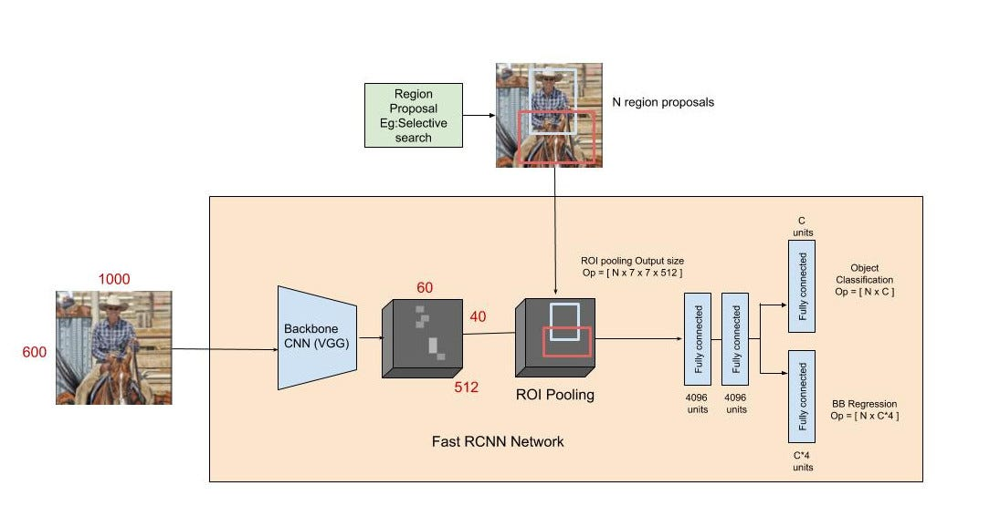

El mismo autor del artículo anterior (R-CNN) resolvió algunos de los inconvenientes de R-CNN para construir un algoritmo de detección de objetos más rápido y lo llamó Fast R-CNN.

 Fast R-CNN, toma la imagen completa y las propuestas de región como entrada en su arquitectura CNN. También combina diferentes partes de la arquitectura (como ConvNet, agrupación de RoI y capa de clasificación) en una arquitectura completa. Esto también elimina el requisito de almacenar un mapa de características y ahorra espacio en disco. También utiliza la capa softmax en lugar de SVM en su propuesta de clasificación de región, que demostró ser más rápida y generar mayor precisión que SVM.

**Funcionamiento del ROI Pooling:**

*   Generación del mapa de características:

  La imagen completa se pasa a través de varias capas convolucionales para producir un mapa de características (feature map).
Esto se hace una sola vez para toda la imagen, lo que mejora la eficiencia computacional.

*   Proyección de las ROIs al mapa de características:

  Las coordenadas de cada ROI se mapean al espacio del mapa de características, ajustando según la escala y las operaciones de pooling realizadas en las capas convolucionales.

*   División de cada ROI en una cuadrícula:

  Cada ROI mapeado se divide en una cuadrícula predefinida (por ejemplo, 7x7 celdas).
  El tamaño de la cuadrícula es fijo y determina el tamaño de salida del ROI Pooling.

*   Aplicación de Max Pooling en cada celda:

  Dentro de cada celda de la cuadrícula, se aplica una operación de max pooling.
Esta operación resume las características dentro de cada celda en un solo valor máximo.

*   Generación de una representación de tamaño fijo:

  El resultado es un mapa de características de tamaño fijo para cada ROI, independientemente de su tamaño original.
Estas características pueden ser alimentadas a capas completamente conectadas y clasificadores posteriores.

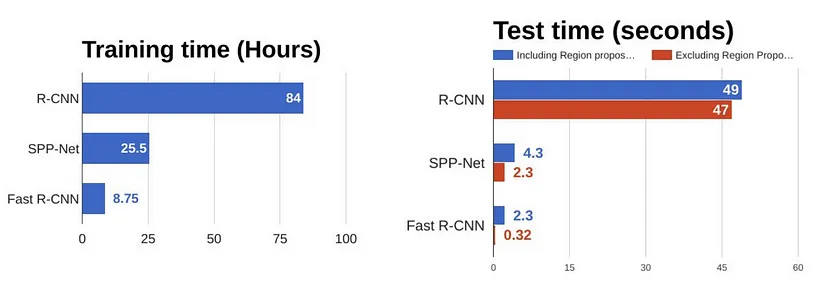

De los gráficos anteriores, se puede inferir que Fast R-CNN es significativamente más rápido en sesiones de entrenamiento y prueba que R-CNN. Cuando observa el rendimiento de Fast R-CNN durante el tiempo de prueba, incluir propuestas de región ralentiza significativamente el algoritmo en comparación con no utilizar propuestas de región. Por lo tanto, las propuestas de región se convierten en cuellos de botella en el algoritmo Fast R-CNN y afectan su rendimiento.

## **Faster RCNN**

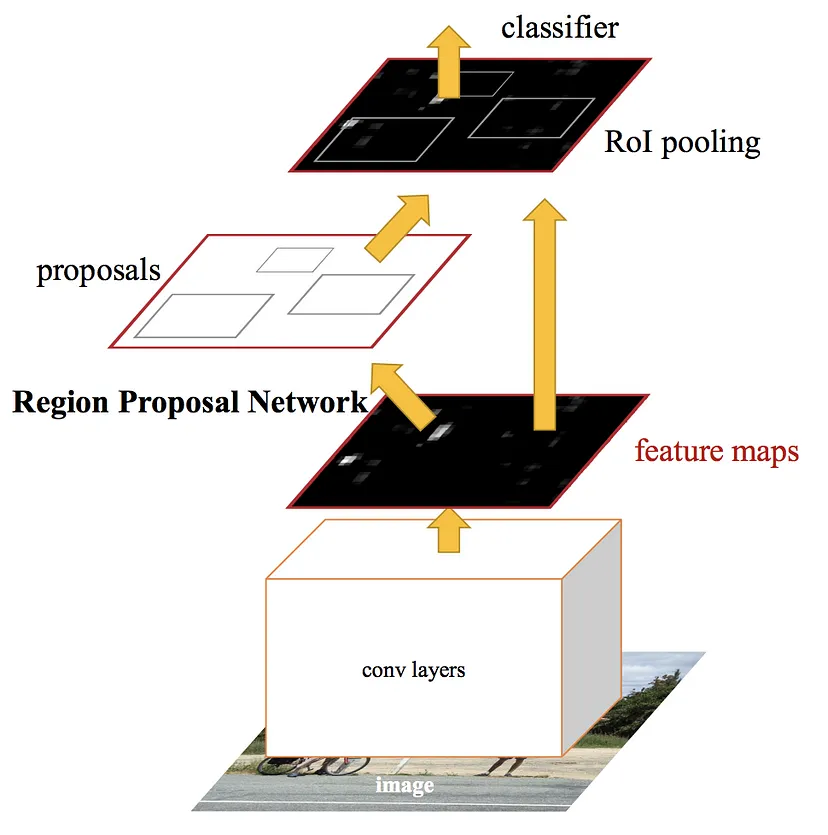

Los dos algoritmos anteriores (R-CNN y Fast R-CNN) utilizan la búsqueda selectiva para encontrar las propuestas de región. La búsqueda selectiva es un proceso lento y que requiere mucho tiempo y afecta el rendimiento de la red. Por tanto, Shaoqing Ren et al . Se le ocurrió un algoritmo de detección de objetos que elimina el algoritmo de búsqueda selectiva y permite que la red conozca las propuestas de la región.

De manera similar a Fast R-CNN, la imagen se proporciona como entrada a una red convolucional que proporciona un mapa de características convolucionales. En lugar de utilizar un algoritmo de búsqueda selectiva en el mapa de características para identificar las propuestas de la región, se utiliza una red separada para predecir las propuestas de la región.

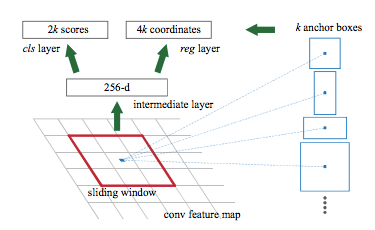

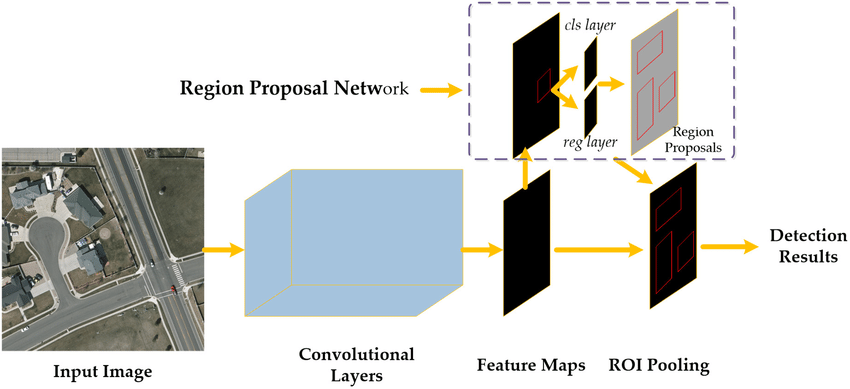

La Red de Propuestas de Región (Region Proposal Network o RPN) es una parte fundamental del modelo Faster R-CNN, utilizada para generar propuestas de regiones candidatas que pueden contener objetos en una imagen. La RPN es una red neuronal convolucional que opera sobre la característica de la imagen de entrada y produce un conjunto de regiones propuestas junto con sus respectivos cuadros delimitadores (bounding boxes) y puntajes de confianza.

1. **Características de la Imagen de Entrada**:
   - La RPN toma como entrada la característica de una imagen extraída por una red convolucional, como una CNN pre-entrenada, que suele ser la misma CNN utilizada en el modelo Faster R-CNN. Esta característica representa las características visuales de la imagen en diferentes niveles de abstracción.

2. **Convoluciones de Anclajes (Anchor Convolutions)**:
   - La RPN utiliza convoluciones 3x3 (o kernel de otro tamaño) para escanear las características de la imagen en busca de regiones propuestas.
   - En cada ubicación de la característica, se evalúa un conjunto predefinido de "anclajes" (anchors) que son cuadros delimitadores de diferentes tamaños y relaciones de aspecto. Estos anclajes actúan como propuestas iniciales.

3. **Predicciones de la RPN**:
   - Para cada anclaje en cada ubicación de la característica, la RPN genera dos predicciones:
     - **Puntuación de Objeto (Objectness Score)**: La RPN calcula la probabilidad de que el anclaje contenga un objeto de interés en lugar de fondo. Esto se hace mediante una función de activación sigmoide, donde una puntuación cercana a 1 indica alta probabilidad de contener un objeto y una puntuación cercana a 0 indica alta probabilidad de ser fondo.
     - **Ajuste del Cuadro Delimitador (Bounding Box Regression)**: La RPN también predice cómo ajustar (trasladar y escalar) el cuadro delimitador del anclaje para que se ajuste mejor a un objeto presente en esa región.

4. **Generación de Propuestas**:
   - Los anclajes se filtran y se seleccionan según su puntuación de objeto. Aquellos con una puntuación alta se consideran regiones prometedoras.
   - Luego, se aplican los ajustes de cuadro delimitador predichos a estos anclajes para generar las propuestas finales de regiones candidatas junto con sus cuadros delimitadores ajustados.

La RPN es entrenada conjuntamente con el detector de objetos (la parte de clasificación y refinamiento de cuadros delimitadores) en el modelo Faster R-CNN. Durante el entrenamiento, se utilizan anotaciones de datos de entrenamiento para ajustar los parámetros de la RPN para que pueda generar propuestas de regiones efectivas.



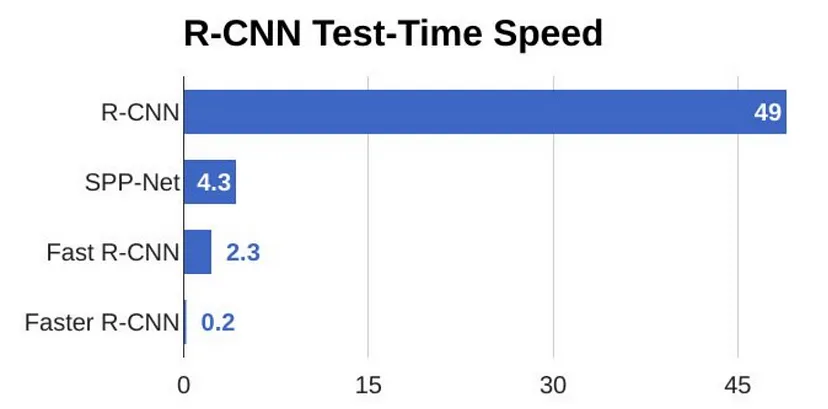

# RCNN básica

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf
from google.colab import files
import pathlib
import itertools
import random



puedo buscar un modelo preentrenado
https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

In [ ]:
#Baje el ZIP de GUNS y descomprimalo en el content/
%cd /content/

!unzip /content/Weapon.v1i.voc.zip
#!unzip /content/gunniest/gunniest.zip  -d /content/gunniest

/content
Archive:  /content/Weapon.v1i.voc.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
   creating: test/
 extracting: test/-111_jpeg_jpg.rf.5a53bceb3f05c8e1065a859f4972b3dc.jpg  
  inflating: test/-111_jpeg_jpg.rf.5a53bceb3f05c8e1065a859f4972b3dc.xml  
 extracting: test/-118_jpeg_jpg.rf.5c6c266e878c2b1e89475456ab6c7316.jpg  
  inflating: test/-118_jpeg_jpg.rf.5c6c266e878c2b1e89475456ab6c7316.xml  
 extracting: test/-129_jpeg_jpg.rf.47c81e84f34aa6ab2440540cb16319ef.jpg  
  inflating: test/-129_jpeg_jpg.rf.47c81e84f34aa6ab2440540cb16319ef.xml  
 extracting: test/-12_jpeg_jpg.rf.ff22c97c05a039c55704cd976afbabc7.jpg  
  inflating: test/-12_jpeg_jpg.rf.ff22c97c05a039c55704cd976afbabc7.xml  
 extracting: test/-131_png_jpg.rf.4a4164c8eac9714007e5388d2ed1cf5e.jpg  
  inflating: test/-131_png_jpg.rf.4a4164c8eac9714007e5388d2ed1cf5e.xml  
 extracting: test/-1_jpeg_jpg.rf.87f6046febe7f6ffcb666fdf70235932.jpg  
  inflating: test/-1_jpeg_jpg.rf.87f6046febe7f6ffc

In [ ]:
# Importa la biblioteca xml.etree.ElementTree y la asigna a un alias ET.
import xml.etree.ElementTree as ET

# Importa la biblioteca OpenCV, que se utiliza para el procesamiento de imágenes.
import cv2

# Importa la función 'pyplot' de la biblioteca Matplotlib y la asigna a un alias 'plt'.
from matplotlib import pyplot as plt


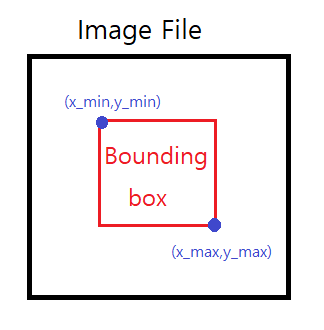

In [ ]:
# Importa la biblioteca xml.etree.ElementTree para el procesamiento de archivos XML.
import xml.etree.ElementTree as ET

# Define una función llamada 'read_content' que toma un nombre de archivo XML como entrada.
def read_content(xml_file: str):
    # Parsea el archivo XML y obtiene un objeto de árbol XML.
    tree = ET.parse(xml_file)

    # Obtiene la raíz del árbol XML.
    root = tree.getroot()

    # Crea una lista vacía para almacenar las coordenadas de las cajas.
    list_with_all_boxes = []

    # Itera a través de los elementos 'object' en el XML.
    for boxes in root.iter('object'):
        # Obtiene el nombre del archivo a partir del elemento 'filename' en la raíz.
        filename = root.find("filename").text

        # Obtiene las coordenadas de las cajas (ymin, xmin, ymax, xmax) de los elementos 'bndbox'.
        ymin, xmin, ymax, xmax = None, None, None, None
        ymin = int(boxes.find("bndbox/ymin").text)
        xmin = int(boxes.find("bndbox/xmin").text)
        ymax = int(boxes.find("bndbox/ymax").text)
        xmax = int(boxes.find("bndbox/xmax").text)

        # Crea una lista con las coordenadas de una caja y la agrega a la lista de todas las cajas.
        list_with_single_boxes = [xmin, ymin, xmax, ymax]
        list_with_all_boxes.append(list_with_single_boxes)

    # Retorna el nombre del archivo y la lista de coordenadas de las cajas.
    return filename, list_with_all_boxes


In [ ]:
name, boxes = read_content("/content/train/-110_jpeg_jpg.rf.ff31b483c893e9c757e34c05ba298dad.xml")

In [ ]:
print(boxes)

[[5, 88, 635, 522]]


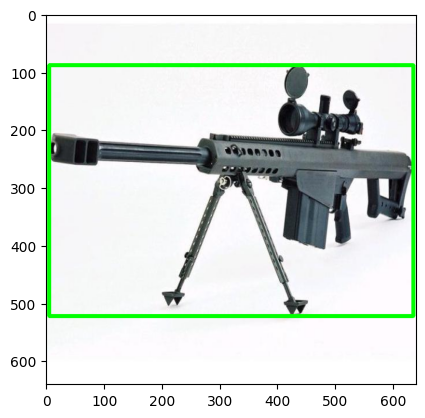

In [ ]:
# Carga la imagen desde la ubicación del archivo usando OpenCV.
img = cv2.imread("/content/train/" + name)

# Convierte la imagen a formato RGB, ya que OpenCV carga imágenes en formato BGR por defecto.
img_map = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Itera a través de las bounding boxes en la lista 'boxes'.
for box in boxes:
    # Extrae las coordenadas de la bounding box.
    xmin = box[0]
    ymin = box[1]
    xmax = box[2]
    ymax = box[3]

    # Dibuja un rectángulo (bounding box) en la imagen con el color verde (0, 255, 0) y un grosor de línea de 5.
    cv2.rectangle(img_map, (xmin, ymin), (xmax, ymax), (0, 255, 0), 5)

# Muestra la imagen con las bounding boxes dibujadas utilizando Matplotlib.
plt.imshow(img_map)
plt.show()


La función `createSelectiveSearchSegmentation` es parte del módulo `cv2.ximgproc.segmentation` en OpenCV y se utiliza para crear un objeto que realiza segmentación basada en Selective Search en una imagen. Aquí tienes una explicación de lo que hace esta función:

1. **Creación del objeto Selective Search**: Cuando llamas a `createSelectiveSearchSegmentation()`, estás creando una instancia de un objeto que implementa el algoritmo Selective Search. Selective Search es un método utilizado en visión por computadora para proponer regiones potenciales en una imagen que pueden contener objetos de interés. Estas regiones se utilizan comúnmente en tareas de detección de objetos para reducir la cantidad de área de la imagen que se analiza más detenidamente.

2. **Configuración del objeto**: Una vez creado el objeto, puedes configurarlo para funcionar de diferentes maneras. En el código que proporcionaste, se llama a `switchToSelectiveSearchFast()`, lo que configura el objeto para que realice Selective Search de manera rápida. También hay otros modos como `switchToSelectiveSearchQuality()` para obtener resultados más precisos pero a costa de mayor tiempo de cómputo.

3. **Procesamiento de la imagen**: Después de configurar el objeto, se utiliza la función `process()` para aplicar Selective Search a la imagen base. Esta función procesa la imagen y genera una lista de regiones propuestas que se consideran prometedoras para la detección de objetos.

En resumen, `createSelectiveSearchSegmentation` crea un objeto que implementa el algoritmo Selective Search, que es utilizado para proponer regiones potenciales en una imagen, lo que es útil en tareas de detección de objetos en visión por computadora. El modo de funcionamiento del algoritmo (rápido o preciso) se puede configurar según las necesidades del proyecto.

El número de posibles bounding boxes es: 2716


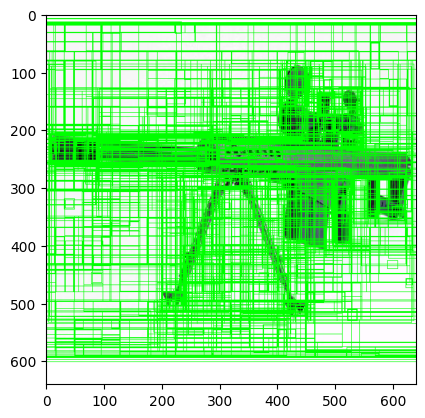

In [ ]:
# Carga la imagen desde la ubicación del archivo usando OpenCV.
img = cv2.imread("/content/train/" + name)

# Convierte la imagen a formato RGB, ya que OpenCV carga imágenes en formato BGR por defecto.
img_map = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Crea un objeto 'SelectiveSearchSegmentation' utilizando OpenCV.
bus_sel = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

# Establece la imagen base para el proceso de Selective Search.
bus_sel.setBaseImage(img)

# Configura el modo de Selective Search a 'SelectiveSearchFast'.
bus_sel.switchToSelectiveSearchFast()

# Realiza el proceso de Selective Search para proponer regiones potenciales.
rects = bus_sel.process()

# Imprime el número de posibles bounding boxes (regiones) propuestas.
print("El número de posibles bounding boxes es:", len(rects))

# Itera a través de las regiones propuestas y dibuja rectángulos en la imagen base.
for (x, y, w, h) in rects:
    cv2.rectangle(img_map, (x, y), (x + w, y + h), (0, 255, 0), 1)

# Muestra la imagen con los rectángulos que representan las regiones propuestas.
plt.imshow(img_map)
plt.show()


La función `IOU` calcula el índice de superposición de IoU (Intersección sobre Unión) entre dos bounding boxes (cajas delimitadoras) en una imagen. Aquí tienes una explicación de lo que hace cada parte de la función:

1. **Cálculo de la Intersección**:
   - `x1I` y `y1I` representan las coordenadas del vértice superior izquierdo de la intersección entre las dos bounding boxes. Se calculan tomando el valor máximo de las coordenadas `x` e `y` del primer bounding box (`box1`) y el segundo bounding box (`box2`), respectivamente.
   - `x2I` y `y2I` representan las coordenadas del vértice inferior derecho de la intersección y se calculan tomando el valor mínimo de las coordenadas `x` e `y` del primer y segundo bounding boxes, respectivamente.

2. **Área de la Intersección**:
   - `interArea` calcula el área de la intersección entre los dos bounding boxes utilizando las coordenadas de la intersección calculadas en el paso anterior.

3. **Áreas de los Bounding Boxes**:
   - `box1Area` y `box2Area` calculan las áreas de los bounding boxes `box1` y `box2`, respectivamente. Estas áreas se calculan multiplicando el ancho (diferencia entre las coordenadas `x`) por la altura (diferencia entre las coordenadas `y`) de cada bounding box.

4. **Cálculo del Índice de Superposición IoU**:
   - `iou` calcula el índice de superposición de IoU dividiendo el área de la intersección (`interArea`) entre la unión de las áreas de los dos bounding boxes (`box1Area + box2Area - interArea`).

5. **Retorno del Valor de IoU**:
   - La función devuelve el valor de IoU, que es un número entre 0 y 1. Cuanto más cercano a 1, mayor es la superposición entre las bounding boxes, lo que indica una mayor intersección.

En resumen, esta función es útil para calcular cuánto se superponen dos bounding boxes, lo que es importante en tareas de detección de objetos para evaluar la precisión de las predicciones al compararlas con bounding boxes de referencia (ground truth).

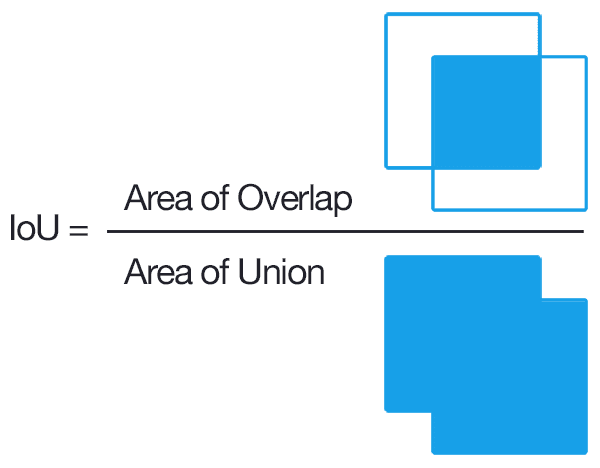

In [ ]:


def IOU(box1, box2):
    # Coordenadas de la intersección
    x1I = max(box1[0], box2[0])  # Coordenada x del vértice superior izquierdo de la intersección
    y1I = max(box1[1], box2[1])  # Coordenada y del vértice superior izquierdo de la intersección
    x2I = min(box1[2], box2[2])  # Coordenada x del vértice inferior derecho de la intersección
    y2I = min(box1[3], box2[3])  # Coordenada y del vértice inferior derecho de la intersección

    # Área del rectángulo de la intersección
    interArea = max(0, x2I - x1I + 1) * max(0, y2I - y1I + 1)

    # Áreas de los bounding boxes (box1 y box2)
    box1Area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1)
    box2Area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1)

    # Calcular el índice de superposición IoU (Intersección sobre Unión)
    iou = interArea / float(box1Area + box2Area - interArea)

    return iou


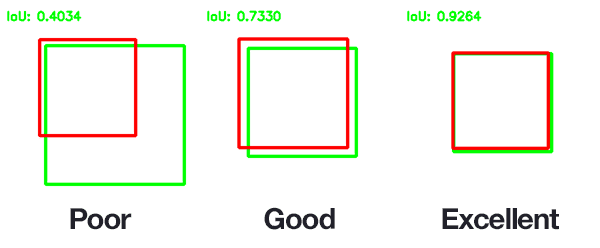

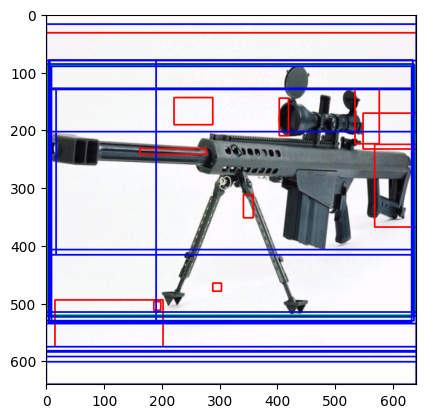

In [ ]:
# Carga la imagen desde la ubicación del archivo usando OpenCV y la convierte a formato RGB.
img = cv2.imread("/content/train/" + name)
img_map = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Crea un objeto 'SelectiveSearchSegmentation' para realizar Selective Search en la imagen.
bus_sel = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
bus_sel.setBaseImage(img)

# Configura el modo de Selective Search a 'SelectiveSearchFast'.
bus_sel.switchToSelectiveSearchFast()

# Realiza el proceso de Selective Search y obtiene una lista de regiones propuestas 'rects'.
rects = bus_sel.process()

# Itera a través de las primeras 20 bounding boxes ground truth y las muestra en la imagen.
for box in boxes[:20]:
    xmin = box[0]
    ymin = box[1]
    xmax = box[2]
    ymax = box[3]
    cajal = [xmin, ymin, xmax, ymax]
    cv2.rectangle(img_map, (xmin, ymin), (xmax, ymax), (0, 255, 0), 5)

# Inicializa una variable para contar las regiones negativas.
ROInegativas = 0

# Itera a través de las regiones propuestas por Selective Search.
for (x, y, w, h) in rects:
    caja2 = [x, y, x + w, y + h]
    iu = IOU(cajal, caja2)

    # Si el índice de superposición (IoU) es mayor o igual a 0.6, se dibuja un rectángulo rojo.
    if iu >= 0.6:
        cv2.rectangle(img_map, (x, y), (x + w, y + h), (0, 0, 255), 2)

    # Si el IoU es menor o igual a 0.05 y el número de regiones negativas no supera 10, se dibuja un rectángulo azul.
    if iu <= 0.05 and ROInegativas <= 10:
        cv2.rectangle(img_map, (x, y), (x + w, y + h), (255, 0, 0), 2)
        ROInegativas += 1

# Muestra la imagen con las bounding boxes dibujadas.
plt.imshow(img_map)
plt.show()


## Bounding box regressor

In [ ]:
import glob
from tensorflow.keras.preprocessing.image import img_to_array #Img a array
from tensorflow.keras.preprocessing.image import load_img # cargar imagenes pillow

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from tensorflow import keras
import tensorflow.keras.layers as LK
import tensorflow.keras.models as MK
from keras.models import load_model
from sklearn.metrics import confusion_matrix
#import seaborn as sns; sns.set()
from sklearn.metrics import classification_report
import time
import tensorflow as tf



In [ ]:
files= glob.glob("/content/train/*.xml", recursive=True)
for file in files:
  name, boxes = read_content(file)
  print(boxes)

[[27, 198, 601, 474]]
[[201, 277, 548, 365]]
[[1, 177, 639, 638]]
[[200, 277, 613, 462]]
[[169, 140, 553, 459]]
[[163, 203, 469, 474]]
[[157, 64, 248, 384], [48, 14, 167, 456], [458, 456, 602, 572], [288, 90, 362, 364], [419, 83, 486, 354], [71, 430, 451, 638], [352, 90, 424, 357], [223, 94, 300, 361], [470, 74, 583, 380]]
[[53, 51, 600, 636]]
[[31, 385, 350, 627], [128, 205, 491, 488], [225, 36, 620, 332]]
[[80, 141, 616, 592]]
[[15, 6, 641, 67], [47, 128, 567, 203], [12, 77, 557, 126], [28, 583, 572, 641], [27, 360, 602, 445], [19, 504, 574, 580], [49, 288, 563, 358], [47, 205, 563, 285], [38, 442, 580, 505]]
[[50, 144, 613, 578], [246, 1, 641, 204]]
[[48, 19, 639, 493]]
[[113, 459, 226, 552], [319, 160, 577, 364]]
[[179, 275, 525, 591]]
[[220, 253, 376, 526]]
[[1, 1, 638, 638]]
[[30, 89, 606, 637]]
[[64, 135, 573, 502]]
[[27, 170, 613, 476]]
[[134, 246, 536, 605], [24, 281, 200, 366], [3, 360, 134, 448], [186, 235, 267, 291], [262, 173, 360, 232], [453, 202, 637, 404]]
[[96, 53, 549

In [ ]:
y_train =[]
x_train= []
x_test = []

In [ ]:
import glob
import cv2
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def cargar_imagenes(path):
    # Obtiene una lista de rutas de archivos XML en el directorio especificado.
    files = glob.glob(path + "*.xml", recursive=True)
    print(files)

    x = []  # Almacena las imágenes
    y = []  # Almacena las bounding boxes

    for file in files:
        name, boxes = read_content(file)  # Lee el contenido del archivo XML para obtener el nombre de la imagen y las bounding boxes.
        img_cv = cv2.imread(path + name)  # Carga la imagen con OpenCV.
        (h, w) = img_cv.shape[:2]

        # Calcula las coordenadas normalizadas de la bounding box ground truth.
        xmin = float(boxes[0][0]) / w
        ymin = float(boxes[0][1]) / h
        xmax = float(boxes[0][2]) / w
        ymax = float(boxes[0][3]) / h

        y.append((xmin, ymin, xmax, ymax))  # Agrega las coordenadas normalizadas al conjunto de datos 'y'.

        img = load_img(path + name, target_size=(128, 128))  # Carga la imagen y la redimensiona a 128x128 píxeles.
        img2arr = img_to_array(img)  # Convierte la imagen a un arreglo numérico.

        x.append(img2arr)  # Agrega el arreglo numérico al conjunto de datos 'x'.

    x = np.array(x, dtype="float32") / np.max(x)  # Normaliza las imágenes.
    y = np.array(y, dtype="float32")  # Convierte las bounding boxes a un arreglo numpy.

    return x, y  # Retorna las imágenes normalizadas y las bounding boxes.



In [ ]:

x_train, y_train = cargar_imagenes("/content/train/")




['/content/train/-124_jpeg_jpg.rf.fece86947854812eb5b7391d6e30ebb2.xml', '/content/train/-4_png_jpg.rf.e2e41c9fce91a93ba068319d42c1f541.xml', '/content/train/-79_jpeg_jpg.rf.089c8c8c6b07a93d1e6423967b48fe67.xml', '/content/train/-29_jpeg_jpg.rf.98ce05fe1270b6d62144e2b37e9c159b.xml', '/content/train/-28_jpeg_jpg.rf.e0f84296032b765d3f09a71b0c33f89a.xml', '/content/train/-58_jpeg_jpg.rf.a1e8e02e0c955dd5bce2b9132c1b2b24.xml', '/content/train/-13_jpeg_jpg.rf.efb771e4143625ea1b69ff90c6ab748b.xml', '/content/train/-120_jpeg_jpg.rf.0b146ac8f45cd280be5ca0527e10ca5a.xml', '/content/train/-119_jpeg_jpg.rf.00357b2e55dbf130d80665085b7b23f5.xml', '/content/train/-109_jpeg_jpg.rf.35a949007c4674edd36ac112a891a155.xml', '/content/train/-3_jpeg_jpg.rf.82ad35b80a3717e2767d805b54342355.xml', '/content/train/-10_jpeg_jpg.rf.0f8564a63382281015bca7645825097a.xml', '/content/train/-117_jpeg_jpg.rf.33ac400151c86f118b332f230170c792.xml', '/content/train/-50_jpeg_jpg.rf.601ba305eaefc8d9374e69742fec698b.xml', '/c

In [ ]:
x_test, y_test = cargar_imagenes("/content/test/")

['/content/test/-44_jpeg_jpg.rf.0acd53620e39d0751c5e1959f5e072df.xml', '/content/test/-111_jpeg_jpg.rf.5a53bceb3f05c8e1065a859f4972b3dc.xml', '/content/test/-12_jpeg_jpg.rf.ff22c97c05a039c55704cd976afbabc7.xml', '/content/test/-1_jpeg_jpg.rf.87f6046febe7f6ffcb666fdf70235932.xml', '/content/test/-77_jpeg_jpg.rf.6b6dbcae26f5713c7bbf1b4136159c32.xml', '/content/test/-129_jpeg_jpg.rf.47c81e84f34aa6ab2440540cb16319ef.xml', '/content/test/-54_jpeg_jpg.rf.6ed526b409f4118c79bf46597b91cf1a.xml', '/content/test/-8_png_jpg.rf.c4f274deb3c53fa08ba6d844a8381fe8.xml', '/content/test/-131_png_jpg.rf.4a4164c8eac9714007e5388d2ed1cf5e.xml', '/content/test/-38_jpeg_jpg.rf.70a7e6afc3d92e42d0372ff87462308a.xml', '/content/test/-118_jpeg_jpg.rf.5c6c266e878c2b1e89475456ab6c7316.xml']


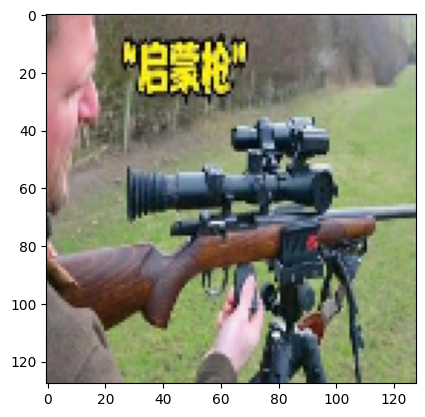

In [ ]:
plt.imshow(x_train[2])

In [ ]:

# Se define el modelo base utilizando pre-entrenada con ciertos ajustes
modelo_base = keras.applications.VGG16(
    include_top=False,  # No incluir las capas densamente conectadas (fully connected layers) al final del modelo
    weights='imagenet',  # Se utilizan los pesos pre-entrenados en el dataset 'imagenet'
    input_tensor=LK.Input(shape=(128, 128, 3))  # Se especifica el tamaño del tensor de entrada
)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
from tensorflow.keras import regularizers

In [ ]:

#Creemos un modelo secuencial
input= modelo_base.output
flat = LK.Flatten()(input)
fc1 = LK.Dense(120,activation='relu', kernel_regularizer=regularizers.l2(0.01))(flat)
drop1 = LK.Dropout(0.15)(fc1)
fc2 = LK.Dense(60,activation='relu',kernel_regularizer=regularizers.l2(0.01))(drop1)
drop2 = LK.Dropout(0.15)(fc2)
fc3 = LK.Dense(30,activation='relu',kernel_regularizer=regularizers.l2(0.01))(drop2)
salida = LK.Dense(4,activation='sigmoid')(fc3)
modelo = MK.Model(modelo_base.input,salida)


In [ ]:
modelo_base.trainable = False

In [ ]:
modelo.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 128, 128, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         983,160 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 15,707,062 (59.92 MB)

 Trainable params: 992,374 (3.79 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
opt= keras.optimizers.Adam(learning_rate=1e-3)

In [ ]:
#modelo.compile(optimizer = "Adam", loss="categorical_crossentropy", metrics=['accuracy'])
modelo.compile(optimizer = opt, loss="mse", metrics=['accuracy'])

In [ ]:
inicio = time.time()
history_transfer = modelo.fit(x_train, y_train, epochs= 5, validation_data=(x_test,y_test), batch_size=16 )
fin = time.time()
tiempo=(fin-inicio)
print("Tardé en entrenar: ", tiempo)

Epoch 1/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.3988 - loss: 3.4255 - val_accuracy: 0.8182 - val_loss: 2.4729
Epoch 2/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.6644 - loss: 2.3128 - val_accuracy: 0.7273 - val_loss: 1.7158
Epoch 3/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.6278 - loss: 1.6382 - val_accuracy: 0.2727 - val_loss: 1.2846
Epoch 4/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.5841 - loss: 1.2384 - val_accuracy: 0.6364 - val_loss: 1.0454
Epoch 5/5
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.5959 - loss: 1.0368 - val_accuracy: 0.4545 - val_loss: 0.9113
Tardé en entrenar:  19.323734998703003


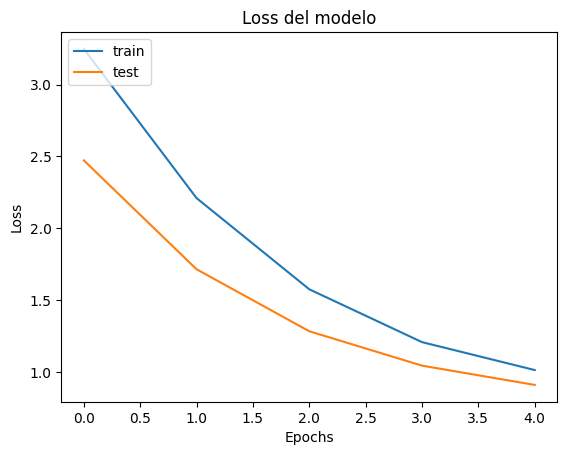

In [ ]:
plt.plot(history_transfer.history["loss"]),
plt.plot(history_transfer.history["val_loss"]),
plt.title("Loss del modelo"),
plt.ylabel("Loss"),
plt.xlabel("Epochs"),
plt.legend(['train','test'], loc= 'upper left')
plt.show()

In [ ]:
files= glob.glob("/content/valid/*.xml", recursive=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step


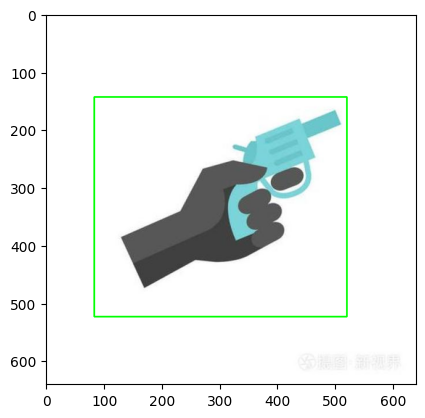

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


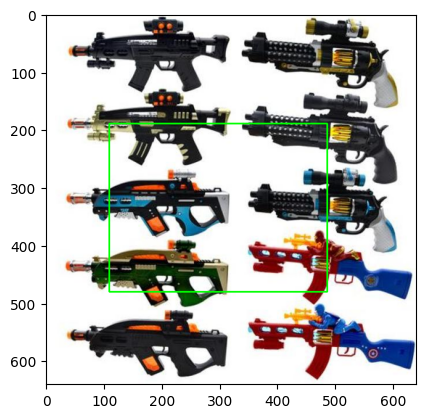

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


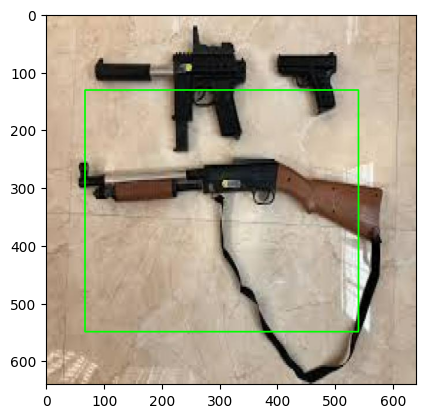

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


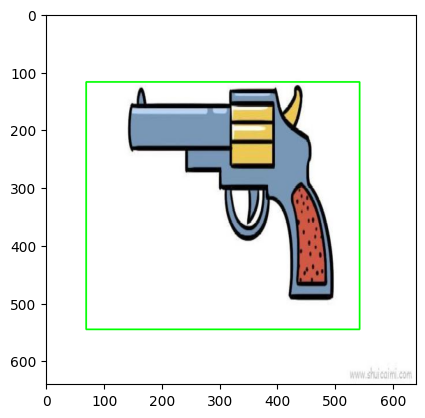

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


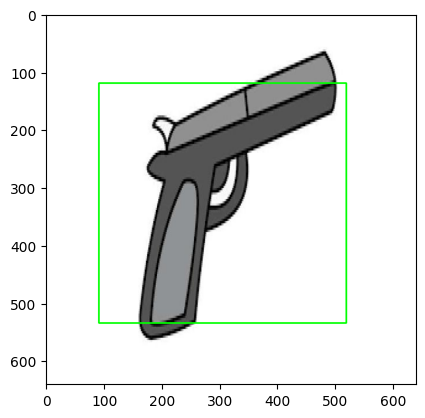

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


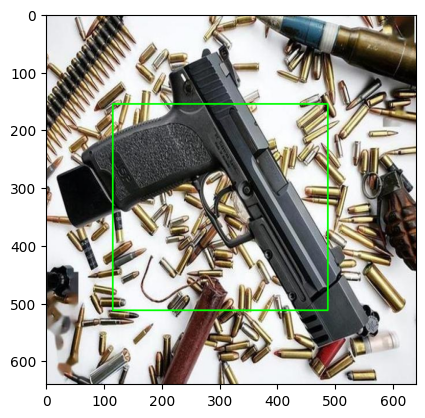

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


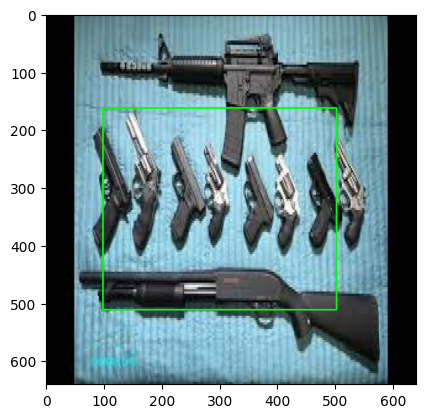

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


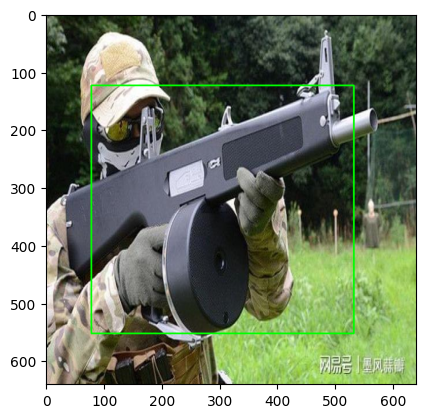

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


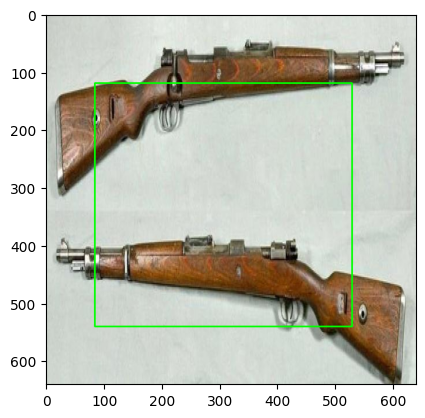

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


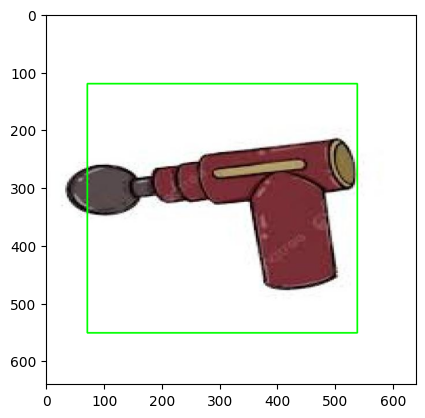

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


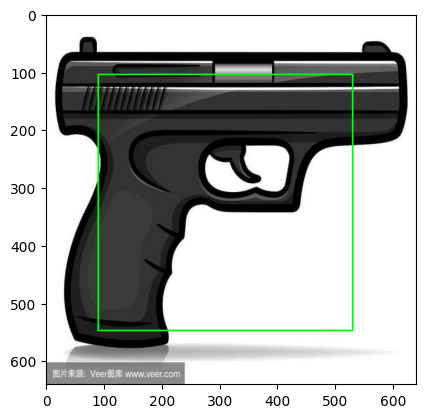

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


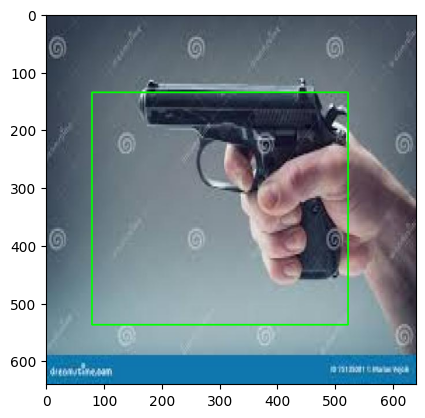

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


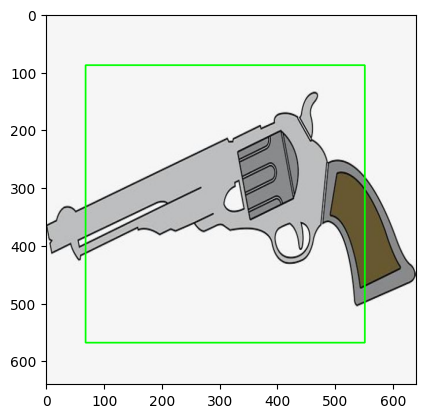

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


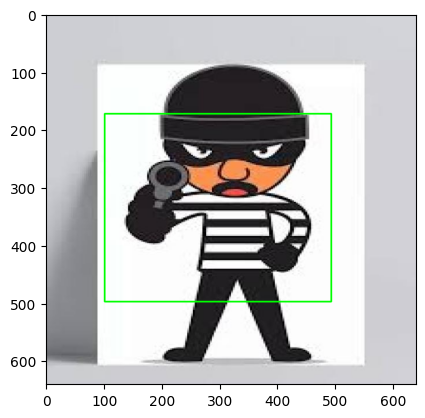

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


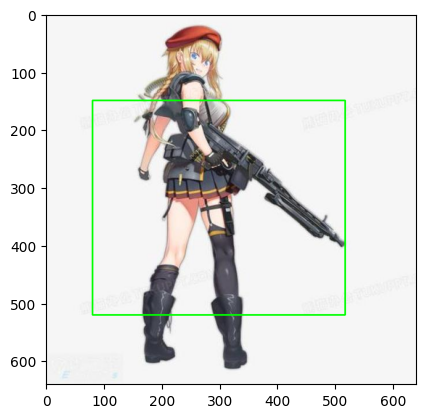

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


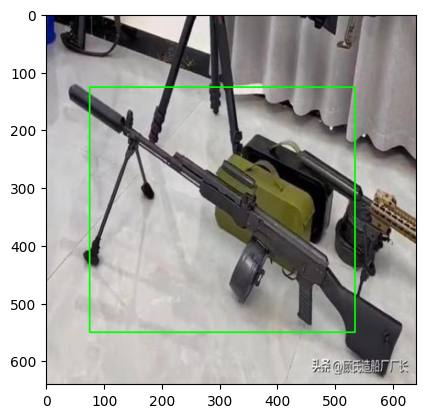

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


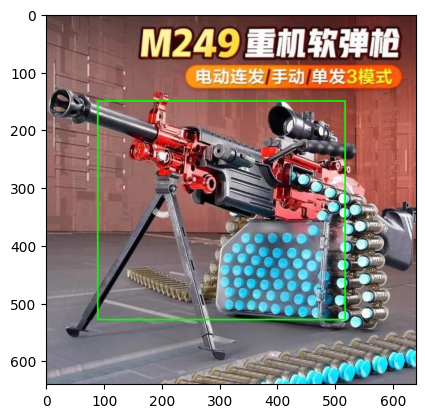

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


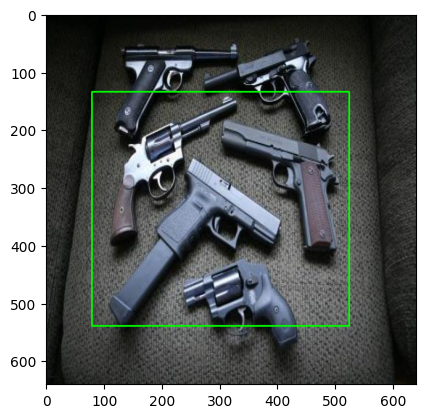

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


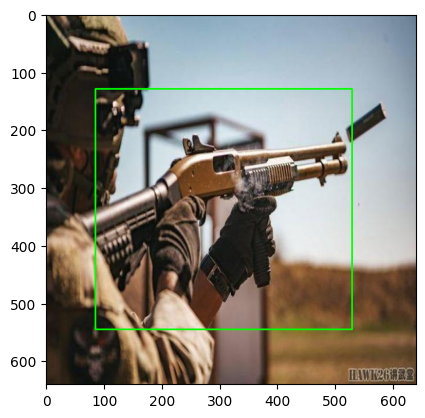

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


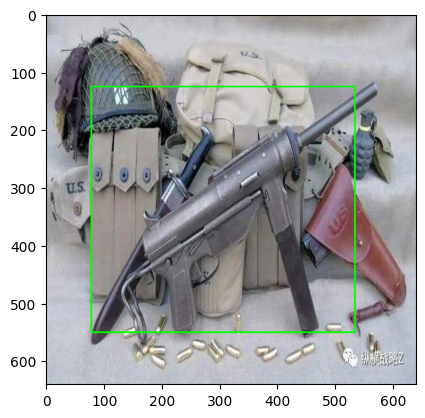

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


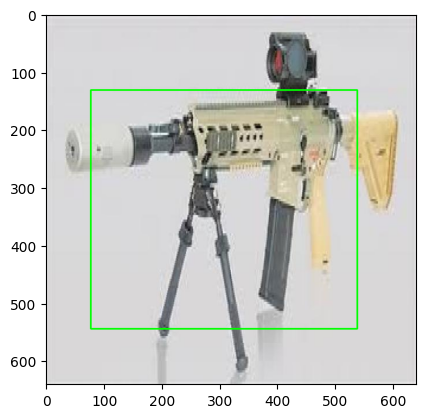

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


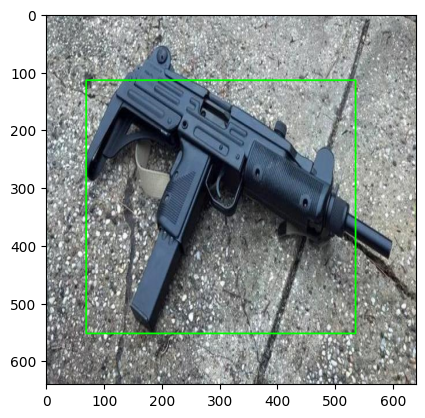

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


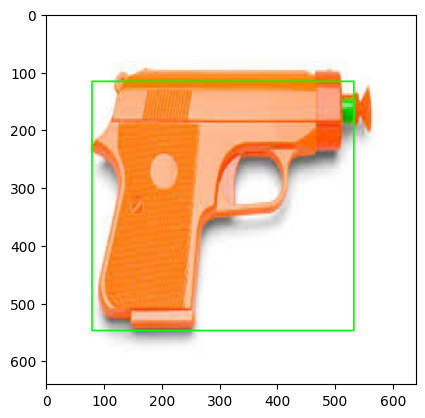

In [ ]:
files= glob.glob("/content/valid/*.xml", recursive=True)

for file in files:

  name, boxes = read_content(file)

  img= load_img("/content/valid/"+ name, target_size=(128,128))

  #640->128
  img2arr = img_to_array(img)/255.0

  img2arr = np.expand_dims(img2arr, axis=0)
  preds=modelo.predict(img2arr)[0]

  #Visualizar bbox en las imgs
  image = cv2.imread("/content/valid/"+ name)
  image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  (h,w) = image.shape[:2]
  xmin = int(preds[0]*w)
  ymin = int(preds[1]*h)
  xmax = int(preds[2]*w)
  ymax = int(preds[3]*h)

  cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0,255,0), 2)

  plt.imshow(image)
  plt.show()




In [ ]:
prueba = np.array([x_train[5],])

In [ ]:
prueba.shape

(1, 128, 128, 3)

In [ ]:
salida = modelo.predict(prueba)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


In [ ]:
salida

array([[0.11207565, 0.18185261, 0.84805506, 0.8668346 ]], dtype=float32)

In [ ]:
x_train[5]

array([[[0.7137255 , 0.7176471 , 0.69411767],
        [0.7411765 , 0.74509805, 0.7137255 ],
        [0.7529412 , 0.7607843 , 0.70980394],
        ...,
        [0.88235295, 0.8901961 , 0.8392157 ],
        [0.8509804 , 0.85882354, 0.80784315],
        [0.8509804 , 0.85882354, 0.80784315]],

       [[0.72156864, 0.7254902 , 0.7019608 ],
        [0.72156864, 0.7254902 , 0.69411767],
        [0.74509805, 0.7529412 , 0.7019608 ],
        ...,
        [0.8745098 , 0.88235295, 0.83137256],
        [0.8509804 , 0.85882354, 0.80784315],
        [0.8509804 , 0.85882354, 0.80784315]],

       [[0.7294118 , 0.73333335, 0.70980394],
        [0.7529412 , 0.75686276, 0.7254902 ],
        [0.74509805, 0.7529412 , 0.7019608 ],
        ...,
        [0.85882354, 0.8666667 , 0.8156863 ],
        [0.85490197, 0.8627451 , 0.8117647 ],
        [0.83137256, 0.8392157 , 0.7882353 ]],

       ...,

       [[0.61960787, 0.61960787, 0.5882353 ],
        [0.62352943, 0.62352943, 0.5921569 ],
        [0.62352943, 0

# **YOLO**

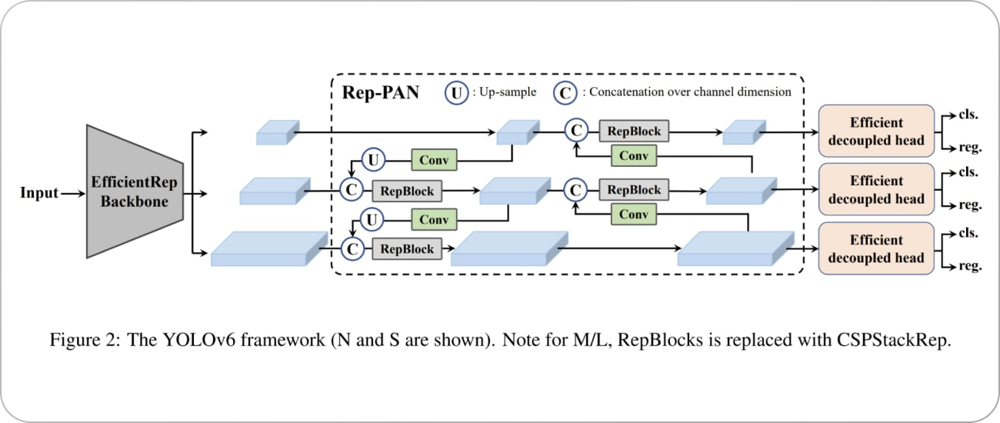

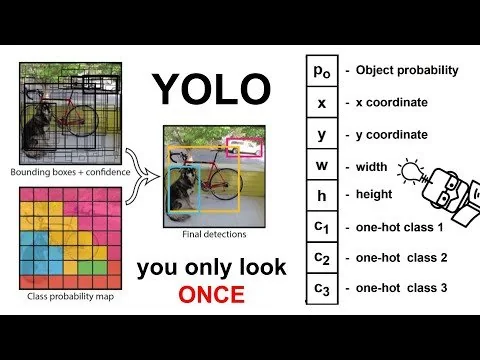